# Code to test logic on image intake

## Testing to see if the notebooks runs the functions

In [35]:
import geopandas as gpd
from shapely.geometry import Point
import folium

In [ ]:
from dotenv import load_dotenv
import os
import openai

# load variables from .env into environment
load_dotenv()

# pull your keys from the environment
ors_api_key   = os.getenv("ORS_API_KEY")
open_api_key  = os.getenv("OPENAI_API_KEY")

# set OpenAI key for the client
openai.api_key = open_api_key



In [39]:
import geopandas as gpd
from shapely.geometry import Point
import openai

def generate_micro_level_spatial_insights(site_coordinates, isochrones, municipal_boundaries, roads_file, land_use_file):
    """
    Generates insights for a spatial analysis task using OpenAI.
    
    Parameters:
    - site_coordinates (tuple): Coordinates of the site (latitude, longitude).
    - isochrones (str): Description of 5- and 10-minute zones from the site.
    - municipal_boundaries (str): Description of the municipal boundaries relevant to the site.
    - roads_file (str): Description of road networks file or key details from it.
    - land_use_file (str): Description of land-use data or key details from it.
    
    Returns:
    - str: AI-generated insights.
    """
    # Create the point geometry from the site coordinates
    site_location = Point(site_coordinates[1], site_coordinates[0])
    
    # Create a GeoDataFrame with the site location
    gdf = gpd.GeoDataFrame([{'geometry': site_location}], crs="EPSG:4326")

    # Generate a 1km buffer around the site location
    buffer_gdf = gdf.buffer(1000)  # 1000 meters = 1km

    # Convert the buffer to GeoJSON (or WKT for simpler text format)
    buffer_geojson = buffer_gdf.to_json()
    
    
    # Construct the prompt for OpenAI
    prompt = f"""
    I am a geospatial analyst conducting a micro-level spatial analysis for the immediate vicinity of a proposed site. Below are the key details for analysis:
    
    - Coordinates of the site: {site_coordinates}.
    - Isochrones: {isochrones}.
    - 1km buffer around the site location: {buffer_geojson}.
    - Important, strict filter: Only describe features and activities within the 1km buffer. Do not include locations outside this area.

    Task:
    Generate a concise and insightful analysis covering:
    1. Major roads close to the site and their significance (e.g., connectivity, traffic).
    2. Key activities happening within the 1km vicinity of the site.
    3. Primary land-use activities around and within the site.
    4. What is the current state or activity occurring at the exact location defined by these coordinates? Please provide a detailed description of the site's usage or condition.
    5. Assess whether the site's location is suitable for a proposed community center, considering accessibility, visibility, and other relevant factors.

    Expected Output:
    - Provide a brief but professional spatial analysis, focusing solely on features within the 1km buffer.
    - Offer strategic, actionable insights about the site's location, considering roads, activities, and land-use types in this area.
    """
    
    # Use OpenAI API to get insights
    try:
        # Request the analysis from OpenAI using the chat-completions endpoint
        response = openai.ChatCompletion.create(
            model="gpt-4",  # Change to "gpt-4" if you have access
            messages=[
                {"role": "user", "content": prompt}
            ],
            max_tokens=500,  # Adjust based on your needs
            temperature=0.7  # Adjust for creativity and randomness in the response
        )

        # Extracting the response text from the returned data
        return response['choices'][0]['message']['content'].strip()

    except Exception as e:
        print(f"Error generating insights: {e}")
        return None


In [38]:
# Example usage:
site_coordinates = (-33.9155, 18.4178) 
isochrones = "5-minute and 10-minute walk zones"
municipal_boundaries = "City boundaries description"
roads_file = "Road networks file or description"
land_use_file = "Land-use data file or description"

insights = generate_micro_level_spatial_insights(site_coordinates, isochrones, municipal_boundaries, roads_file, land_use_file)

# Print the generated insights
print(insights)


/var/folders/w8/vcvmt39x3mqgpvm25j459k_r0000gp/T/ipykernel_85875/2211030935.py:26: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_gdf = gdf.buffer(1000)  # 1000 meters = 1km


As an AI language model, I don't have real-time access to the geographic data, satellite imagery, or the ability to make direct observations. However, I can provide a general framework for how you might go about analyzing this information given the scope of your project.

1. Major Roads: Check for the presence of major roads within the 1km buffer. These provide critical access and visibility to the site. High-traffic roads can also indicate commercial activity and potential pedestrian footfall. Ideally, the site should have good connectivity to residential areas, key landmarks, and public transportation hubs. If possible, consider the direction of traffic flow and any restrictions that might affect accessibility.

2. Key Activities: Identify the key activities happening within the 1km vicinity. This might include residential living, commercial activities, recreational activities, or educational institutions. The nature of these activities can impact the suitability of the site for a co

In [40]:
# Create the Folium map centered around the site location
folium_map = folium.Map(location=site_coordinates, zoom_start=15)

# Add a marker for the site location
folium.Marker(
    location=site_coordinates,
    popup=f"Site Location: {site_coordinates}",
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(folium_map)

# Display the map
folium_map

## TESTING ROAD NAMES IN PROMPTS

In [41]:
import requests

# Coordinates of the point
latitude = -33.9155
longitude = 18.4178

# Overpass API URL
overpass_url = "http://overpass-api.de/api/interpreter"

# Overpass QL query for highways and primary roads within 1km radius
overpass_query = f"""
[out:json];
(
  way(around:1000,{latitude},{longitude})["highway"~"^(motorway|primary|secondary|tertiary)$"];
  way(around:1000,{latitude},{longitude})["name"];
);
out body;
"""

# Send the query to the Overpass API
response = requests.get(overpass_url, params={'data': overpass_query})

# Parse the response (JSON format)
data = response.json()

# Filter for roads with relevant types (motorway, primary, secondary, tertiary)
road_names = set()
for element in data['elements']:
    if 'tags' in element:
        # Only consider major roads (motorway, primary, secondary, tertiary)
        if 'highway' in element['tags'] and element['tags']['highway'] in ['motorway', 'primary', 'secondary', 'tertiary']:
            if 'name' in element['tags']:
                road_names.add(element['tags']['name'])

# Output the filtered road names
print("Filtered Road Names within 1km buffer (Major Roads):", road_names)


Filtered Road Names within 1km buffer (Major Roads): {'Hans Strijdom Avenue', 'Wale Street', 'Long Street', 'Portswood Road', 'South Arm Road', 'Somerset Road', 'Loop Street', 'Buitengracht Street', 'Walter Sisulu Avenue', 'Strand Street', 'Helen Suzman Boulevard', 'Lower Loop Street', 'Dock Road', 'Adderley Street', 'Darling Street', 'Nelson Mandela Boulevard', 'Main Road', 'Hertzog Boulevard', 'Heerengracht Boulevard', 'Lower Long Street', 'High Level Road', 'Riebeek Street'}


##### Updated function with prompt taking in road names in the vicinity as well

In [42]:
import overpy
import openai
from shapely.geometry import Point
import geopandas as gpd
import requests
import json

def get_road_names_from_overpass(site_coordinates, buffer_distance=1000):
    """
    Fetches road names within a specified distance from a given site using Overpass API.
    
    Parameters:
    - site_coordinates (tuple): Coordinates of the site (latitude, longitude).
    - buffer_distance (int): Distance from the site in meters to search for roads.
    
    Returns:
    - list: Road names within the buffer distance.
    """
    # Overpass API query template
    overpass_url = "http://overpass-api.de/api/interpreter"
    
    # Coordinates of the site
    lat, lon = site_coordinates
    
    # Overpass query to fetch roads within a given distance (buffer)
    query = f"""
    [out:json];
    (
      way["highway"](around:{buffer_distance},{lat},{lon});
      way["name"](around:{buffer_distance},{lat},{lon});
    );
    out body;
    """
    
    response = requests.get(overpass_url, params={'data': query})
    
    if response.status_code == 200:
        data = response.json()
        # Extract road names
        road_names = []
        for element in data['elements']:
            if 'tags' in element and 'name' in element['tags']:
                road_names.append(element['tags']['name'])
        return road_names
    else:
        print(f"Error fetching data from Overpass API: {response.status_code}")
        return []

def generate_micro_level_spatial_insights(site_coordinates, isochrones, municipal_boundaries):
    """
    Generates insights for a spatial analysis task using OpenAI.
    
    Parameters:
    - site_coordinates (tuple): Coordinates of the site (latitude, longitude).
    - isochrones (str): Description of 5- and 10-minute zones from the site.
    - municipal_boundaries (str): Description of the municipal boundaries relevant to the site.
    
    Returns:
    - str: AI-generated insights.
    """
    # Get road names from Overpass API
    road_names = get_road_names_from_overpass(site_coordinates)
    
    # Construct the prompt for OpenAI
    prompt = f"""
    I am a geospatial analyst conducting a micro-level spatial analysis for the immediate vicinity of a proposed site. Below are the key details for analysis:
    
    - Coordinates of the site: {site_coordinates}.
    - Isochrones: {isochrones}.
    - Important, strict filter: Only describe features and activities within the immediate area of the site. Do not include locations outside this area.

    Additional Information:
    - Road names within the immediate vicinity: {', '.join(road_names)}.

    Task:
    Generate a concise and insightful analysis covering:
    1. Major roads close to the site and their significance (e.g., connectivity, traffic).
    2. Key activities happening within the immediate vicinity of the site.
    3. Primary land-use activities around and within the site.
    4. What is the current state or activity occurring at the exact location defined by these coordinates? Please provide a detailed description of the site's usage or condition.
    5. Assess whether the site's location is suitable for a proposed community center, considering accessibility, visibility, and other relevant factors.

    Expected Output:
    - Provide a brief but professional spatial analysis, focusing solely on features within the immediate vicinity.
    - Offer strategic, actionable insights about the site's location, considering roads, activities, and land-use types in this area.
    """
    
    # Use OpenAI API to get insights
    try:
        # Request the analysis from OpenAI using the chat-completions endpoint
        response = openai.ChatCompletion.create(
            model="gpt-4",  # Change to "gpt-4" if you have access
            messages=[
                {"role": "user", "content": prompt}
            ],
            max_tokens=500,  # Adjust based on your needs
            temperature=0.7  # Adjust for creativity and randomness in the response
        )

        # Extracting the response text from the returned data
        return response['choices'][0]['message']['content'].strip()

    except Exception as e:
        print(f"Error generating insights: {e}")
        return None


In [43]:
# Example usage:
site_coordinates = (-33.9155, 18.4178)  # Example coordinates of the site
isochrones = "5-minute and 10-minute walk zones"
municipal_boundaries = "City boundaries description"

# Generate insights
insights = generate_micro_level_spatial_insights(site_coordinates, isochrones, municipal_boundaries)

# Print the generated insights
print(insights)

The site is located in the bustling heart of Cape Town, South Africa. The coordinates (-33.9155, 18.4178) indicate that the site is situated in the Cape Town City Centre, where various activities take place.

1. Major Roads: The site is surrounded by several major roads including Nelson Mandela Boulevard, Strand Street, and Helen Suzman Boulevard. These roads are key arteries that connect the city center with other parts of Cape Town. They carry a high volume of both local and commuter traffic, which contributes to the site's high visibility and accessibility.

2. Key Activities: The site is in a vibrant area with a diverse mix of activities. It is close to the Victoria and Alfred Waterfront, a popular tourist attraction with shopping, dining, and entertainment options. Additionally, it is near the Two Oceans Aquarium, Zeitz Museum of Contemporary Art Africa (MOCAA), and the University of Cape Town (Breakwater Campus), suggesting a mix of educational and cultural activities. The densit

## Testing the OpenAI CLIP computer vision model (clip vit16)

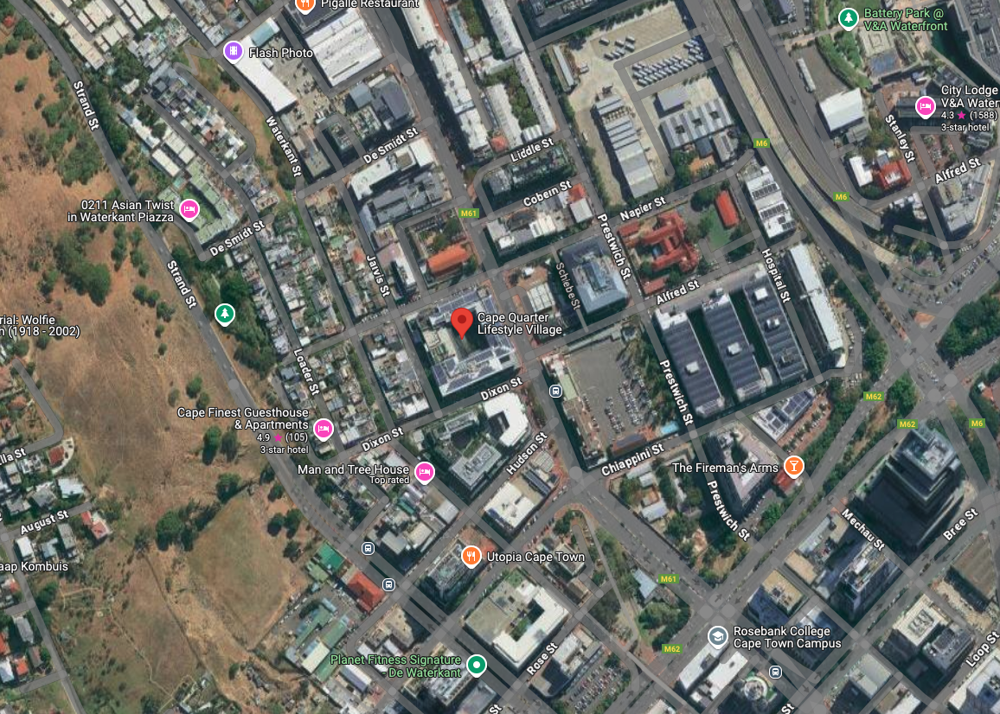

In [44]:
from PIL import Image
import IPython.display as display

# Load the image
image = Image.open("/Users/zain.forbes/Desktop/Screenshot 2024-12-11 at 16.19.59.png")

# Display the image inline
display.display(image)


CLIP can be used to encode both text and images into a shared embedding space, allowing you to match text descriptions to the contents of images.

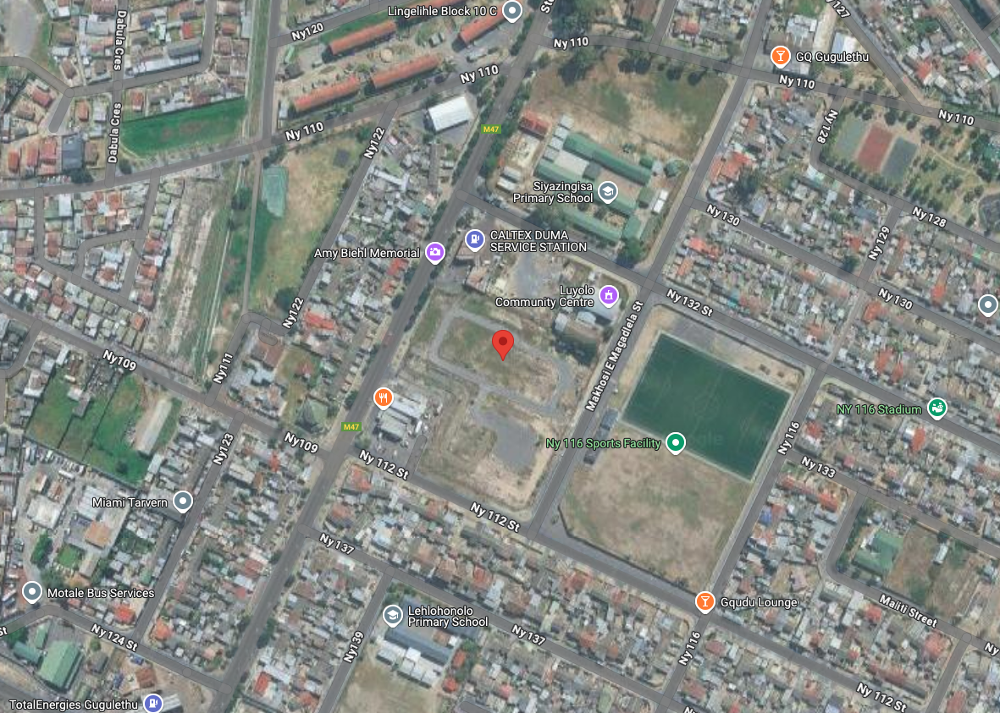

Most relevant description: a well-developed urban area with many buildings
Similarity scores:
a well-developed urban area with many buildings: 84.65%
a building: 0.23%
an empty and undeveloped piece of land: 14.68%
a construction site with ongoing work: 0.45%


In [120]:
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Prompt the user to enter the file path
file_path = input("Enter the location of the image (with apostrophes): ").strip("'")

# Open the image using the provided path
image = Image.open(file_path)

# Display the image inline
display.display(image)

# Process the image for CLIP model
inputs = processor(text=["a well-developed urban area with many buildings",
"a building",
"an empty and undeveloped piece of land",
"a construction site with ongoing work"], images=image, return_tensors="pt", padding=True)

# Perform the forward pass to get the image and text embeddings
outputs = model(**inputs)
logits_per_image = outputs.logits_per_image # this is the similarity score
probs = logits_per_image.softmax(dim=1) # Get the probability distribution

# Output the most likely description
text_labels = ["a well-developed urban area with many buildings",
"a building",
"an empty and undeveloped piece of land",
"a construction site with ongoing work"]


print(f"Most relevant description: {text_labels[torch.argmax(probs)]}")

# Print similarity scores for each label as a percentage
print("Similarity scores:")
for label, score in zip(text_labels, probs[0]):
    print(f"{label}: {score.item() * 100:.2f}%")


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


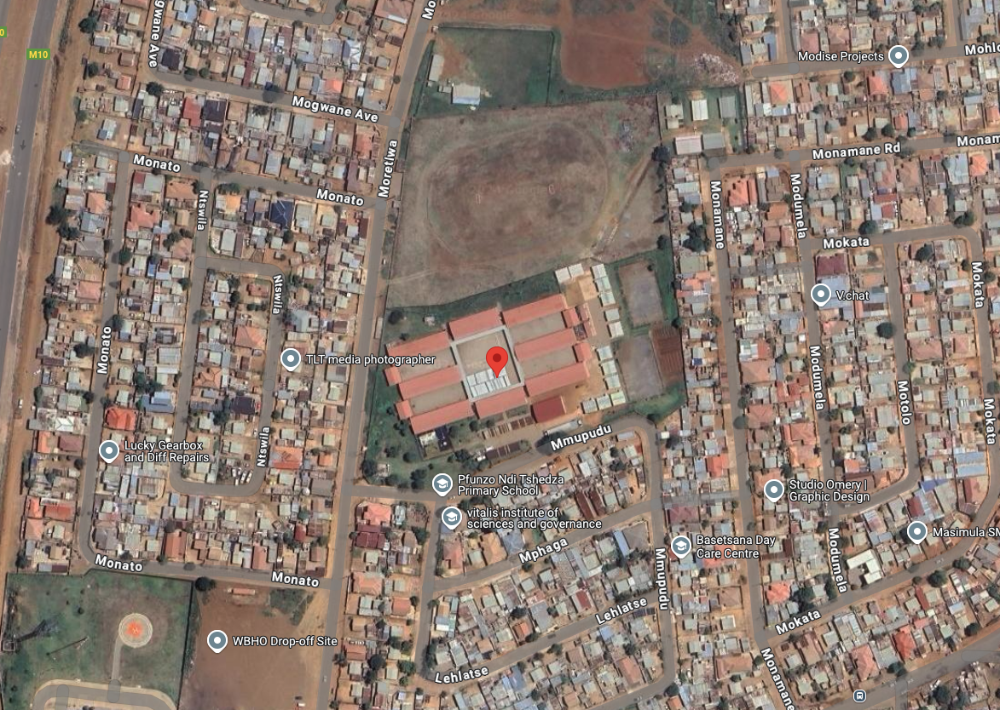

Most relevant description: a well-developed urban area with many buildings


In [48]:
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Load the image (your screenshot or map image)
image2 = Image.open("/Users/zain.forbes/Desktop/Screenshot 2024-12-12 at 10.11.28.png")

# Display the image inline
display.display(image2)

# Process the image for CLIP model
inputs = processor(text=["a well-developed urban area with many buildings",
"an empty and undeveloped piece of land",
"a construction site with ongoing work",
"a vacant lot"], images=image2, return_tensors="pt", padding=True)

# Perform the forward pass to get the image and text embeddings
outputs = model(**inputs)
logits_per_image = outputs.logits_per_image # this is the similarity score
probs = logits_per_image.softmax(dim=1) # Get the probability distribution

# Output the most likely description
text_labels = ["a well-developed urban area with many buildings",
"an empty and undeveloped piece of land",
"a construction site with ongoing work",
"a vacant lot"]
print(f"Most relevant description: {text_labels[torch.argmax(probs)]}")


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


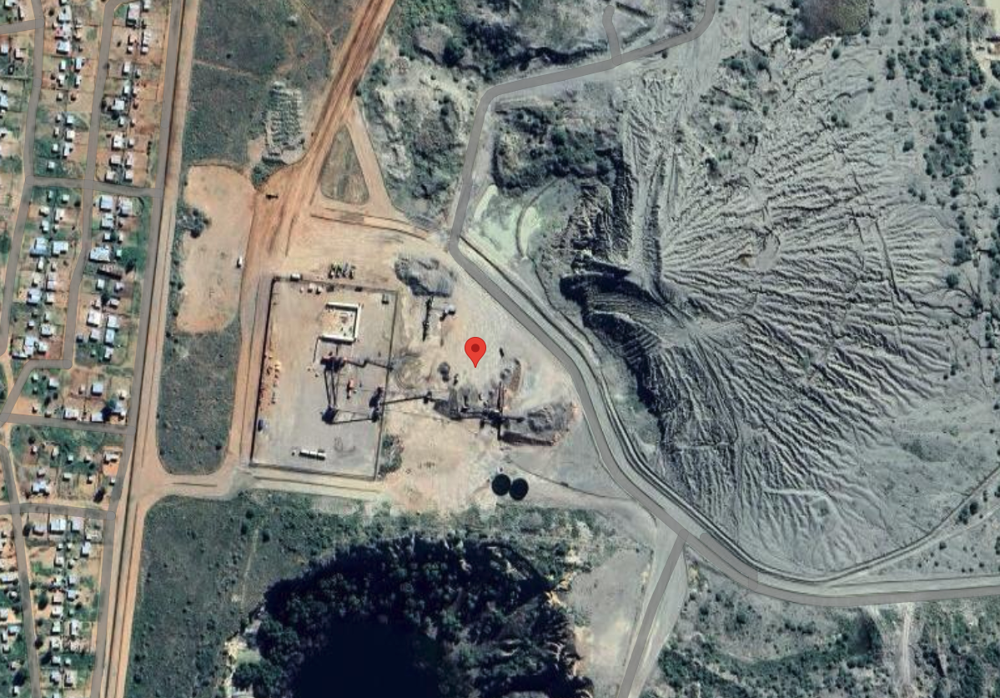

Most relevant description: a vacant and undeveloped plot of land
Similarity scores:
a school building: 0.09%
a hospital or clinic: 1.53%
a residential building: 0.36%
a commercial building: 0.45%
an industrial facility: 31.57%
a construction site with heavy machinery: 27.71%
a playground or recreational facility: 4.07%
a vacant and undeveloped plot of land: 33.87%
a large building used for public administration: 0.35%


In [96]:
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Prompt the user to enter the file path
file_path = input("Enter the location of the image (with apostrophes): ").strip("'")

# Open the image using the provided path
image2 = Image.open(file_path)

# Display the image inline
display.display(image2)

# Updated prompts for more specific identification
text_labels = [
    "a school building",
    "a hospital or clinic",
    "a residential building",
    "a commercial building",
    "an industrial facility",
    "a construction site with heavy machinery",
    "a playground or recreational facility",
    "a vacant and undeveloped plot of land",
    "a large building used for public administration"
]

# Process the image for CLIP model
inputs = processor(text=text_labels, images=image2, return_tensors="pt", padding=True)

# Perform the forward pass to get the image and text embeddings
outputs = model(**inputs)
logits_per_image = outputs.logits_per_image  # this is the similarity score
probs = logits_per_image.softmax(dim=1)  # Get the probability distribution

# Output the most likely description
print(f"Most relevant description: {text_labels[torch.argmax(probs)]}")


# Print similarity scores for each label as a percentage
print("Similarity scores:")
for label, score in zip(text_labels, probs[0]):
    print(f"{label}: {score.item() * 100:.2f}%")

ZOOMED IN

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


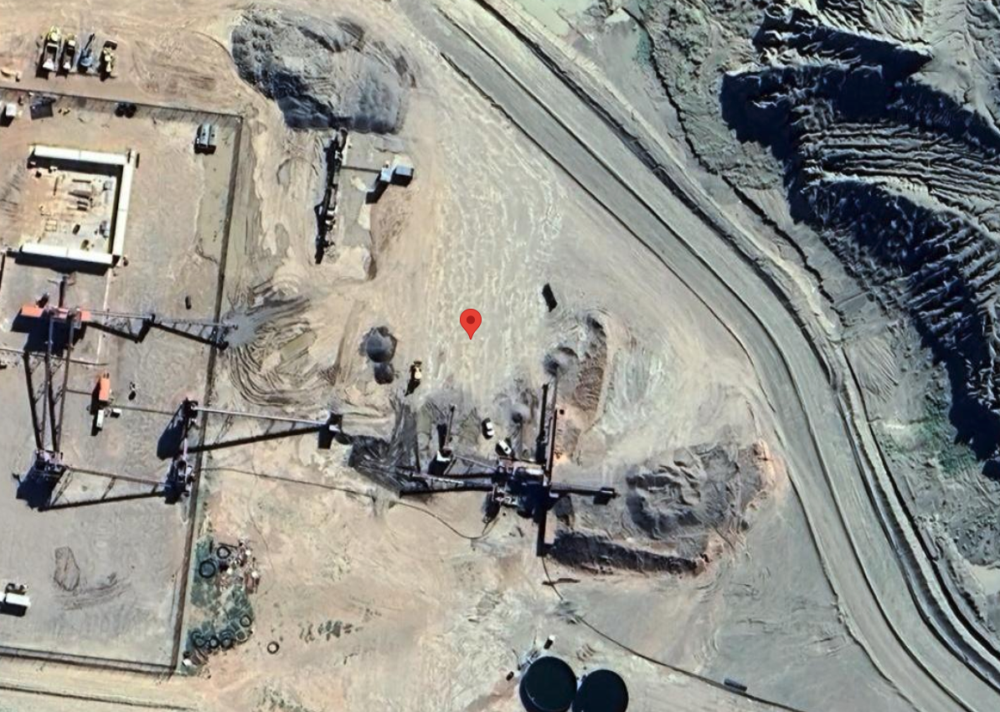

Most relevant description: a construction site with heavy machinery
Similarity scores:
a school building: 0.05%
a hospital or clinic: 0.65%
a house: 0.32%
a commercial building: 0.33%
an industrial facility: 10.76%
a construction site with heavy machinery: 47.01%
a playground or recreational facility: 15.78%
a vacant and undeveloped plot of land: 25.05%
a large building used for public administration: 0.05%


In [97]:
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

# Prompt the user to enter the file path
file_path = input("Enter the location of the image (with apostrophes): ").strip("'")

# Open the image using the provided path
image2 = Image.open(file_path)

# Display the image inline
display.display(image2)

# Updated prompts for more specific identification
text_labels = [
    "a school building",
    "a hospital or clinic",
    "a house",
    "a commercial building",
    "an industrial facility",
    "a construction site with heavy machinery",
    "a playground or recreational facility",
    "a vacant and undeveloped plot of land",
    "a large building used for public administration"
]

# Process the image for CLIP model
inputs = processor(text=text_labels, images=image2, return_tensors="pt", padding=True)

# Perform the forward pass to get the image and text embeddings
outputs = model(**inputs)
logits_per_image = outputs.logits_per_image  # this is the similarity score
probs = logits_per_image.softmax(dim=1)  # Get the probability distribution

# Output the most likely description
print(f"Most relevant description: {text_labels[torch.argmax(probs)]}")
# Print similarity scores for each label as a percentage
print("Similarity scores:")
for label, score in zip(text_labels, probs[0]):
    print(f"{label}: {score.item() * 100:.2f}%")


### Testing VS with feature extraction

In [29]:
import cv2

# Load the image
image = cv2.imread("/Users/zain.forbes/Desktop/Screenshot 2024-12-11 at 16.56.57.png")

# Check if the image is loaded correctly
if image is None:
    print("Error loading image")
else:
    print(f"Image loaded with shape: {image.shape}")


Image loaded with shape: (822, 1428, 3)


In [32]:
import cv2
import numpy as np

# Load the image
image_path = "/Users/zain.forbes/Desktop/Screenshot 2024-12-11 at 16.56.57.png"
image3 = cv2.imread(image_path)

# Check if the image is loaded correctly
if image is None:
    print(f"Failed to load image at {image_path}")
else:
    print(f"Image loaded with shape: {image.shape}")

    # Convert to HSV color space (better for color segmentation)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Define color ranges for vacant land (green for vegetation or open spaces)
    lower_green = np.array([35, 100, 100])  # Lower bound of green
    upper_green = np.array([85, 255, 255])  # Upper bound of green

    # Create a mask to detect green (vacant land or open spaces)
    mask = cv2.inRange(hsv, lower_green, upper_green)
    result = cv2.bitwise_and(image, image, mask=mask)

    # Calculate the ratio of green area in the image
    vacant_ratio = np.sum(mask > 0) / mask.size

    # Set a threshold for vacant land detection (adjust as needed)
    if vacant_ratio > 0.2:  # If more than 20% of the image is green, consider it vacant
        print("Vacant land detected")
    else:
        print("Developed area detected")


Image loaded with shape: (822, 1428, 3)
Developed area detected


# CLIP TESTING VIT14 (MAYBE BETTER RESULTS)

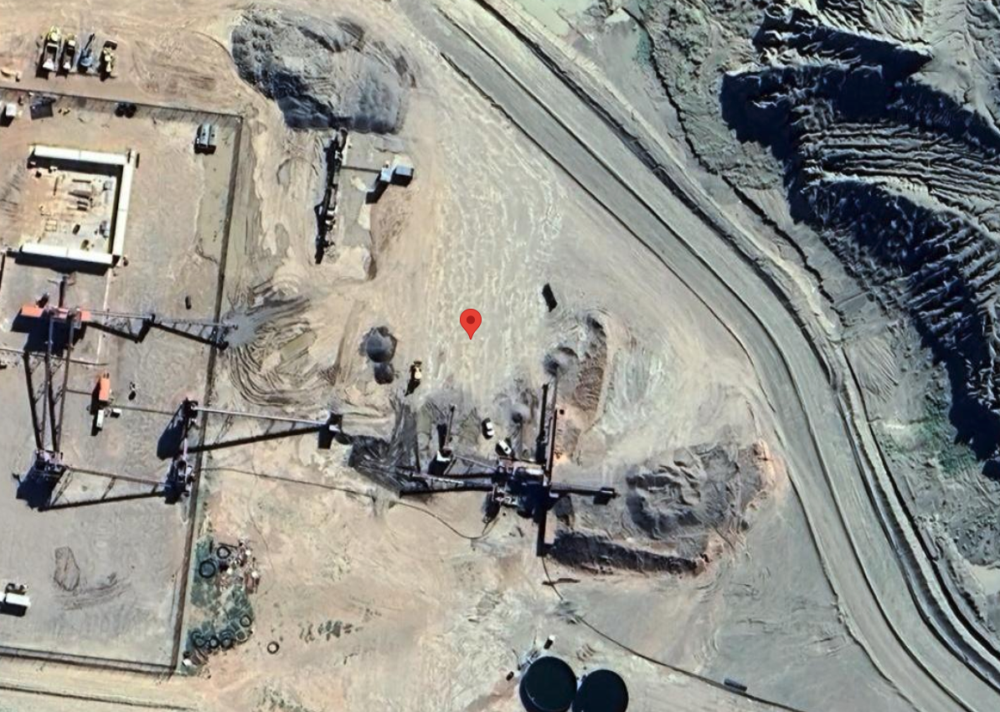

Most relevant description: an empty and undeveloped piece of land
Similarity scores:
a well-developed urban area with many buildings: 0.03%
a building: 0.18%
an empty and undeveloped piece of land: 94.32%
a construction site with ongoing work: 5.47%


In [101]:
from PIL import Image
import torch
from transformers import CLIPProcessor, CLIPModel

# Load the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

# Prompt the user to enter the file path
file_path = input("Enter the location of the image (with apostrophes): ").strip("'")

# Open the image using the provided path
image = Image.open(file_path)

# Display the image inline
display.display(image)

# Process the image for CLIP model
inputs = processor(text=["a well-developed urban area with many buildings",
"a building",
"an empty and undeveloped piece of land",
"a construction site with ongoing work"], images=image, return_tensors="pt", padding=True)

# Perform the forward pass to get the image and text embeddings
outputs = model(**inputs)
logits_per_image = outputs.logits_per_image # this is the similarity score
probs = logits_per_image.softmax(dim=1) # Get the probability distribution

# Output the most likely description
text_labels = ["a well-developed urban area with many buildings",
"a building",
"an empty and undeveloped piece of land",
"a construction site with ongoing work"]


print(f"Most relevant description: {text_labels[torch.argmax(probs)]}")

# Print similarity scores for each label as a percentage
print("Similarity scores:")
for label, score in zip(text_labels, probs[0]):
    print(f"{label}: {score.item() * 100:.2f}%")


# Testing the DFN5B-CLIP-ViT-H-14-378 model

This model was trained on DFN-5B. Data Filtering Networks (DFNs) are small networks used to automatically filter large pools of uncurated data. This model was trained on 5B images that were filtered from a pool of 43B uncurated image-text pairs (12.8B image-text pairs from CommonPool-12.8B + 30B additional public image-text pairs).

## Testing it on an initial analysis

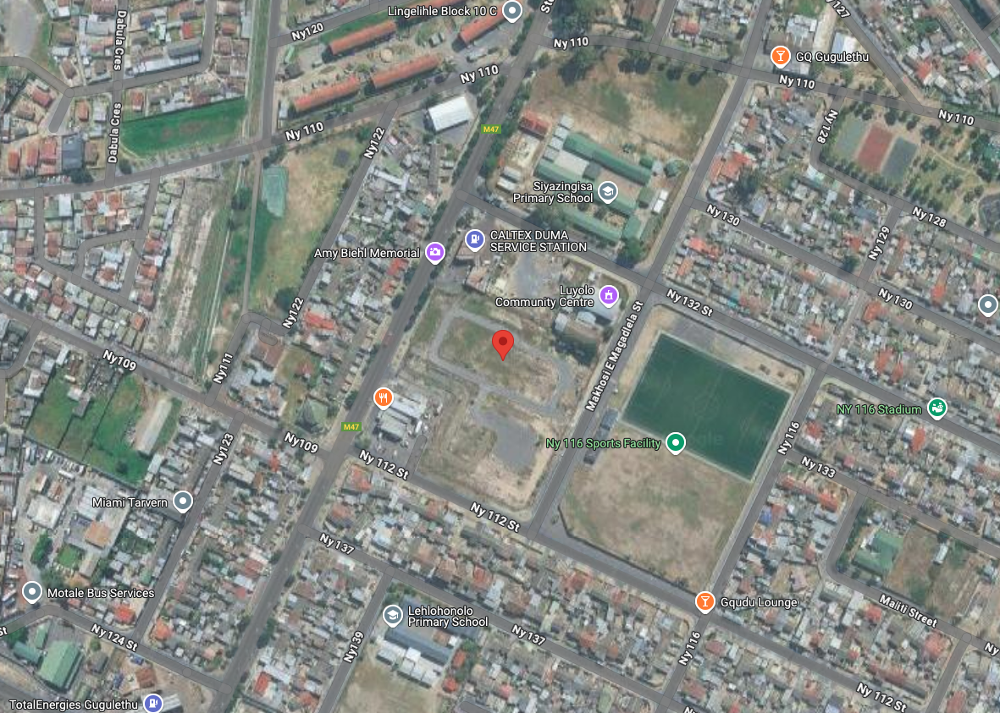

/var/folders/w8/vcvmt39x3mqgpvm25j459k_r0000gp/T/ipykernel_85875/2444652884.py:35: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


Label probabilities (as percentage):  [('a school building', '93.8%'), ('a hospital or clinic', '90.91%'), ('a residential building', '90.68%'), ('a commercial building', '92.41%'), ('an industrial facility', '93.01%'), ('a construction site with heavy machinery', '90.64%'), ('a vacant and undeveloped plot of land', '98.03%'), ('a large building used for public administration', '93.53%')]
Most relevant description: a vacant and undeveloped plot of land


In [133]:
import torch
import torch.nn.functional as F
from urllib.request import urlopen
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# Load the model and tokenizer
model, preprocess = create_model_from_pretrained('hf-hub:apple/DFN5B-CLIP-ViT-H-14-384')
tokenizer = get_tokenizer('ViT-H-14')

# Prompt user to input the URL or file path of the map screenshot image
file_path = input("Enter the location of the map screenshot (with apostrophes): ").strip("'")

# Open the map screenshot image
image = Image.open(file_path)
display.display(image)
image = preprocess(image).unsqueeze(0)  # Preprocess and add batch dimension

# Define the building types labels for classification
labels_list = [
    "a school building",
    "a hospital or clinic",
    "a residential building",
    "a commercial building",
    "an industrial facility",
    "a construction site with heavy machinery",
    "a vacant and undeveloped plot of land",
    "a large building used for public administration"
]

# Tokenize the labels
text = tokenizer(labels_list, context_length=model.context_length)

# Inference using the model to compute text and image features
with torch.no_grad(), torch.cuda.amp.autocast():
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)
    
    # Normalize the features to compute cosine similarity
    image_features = F.normalize(image_features, dim=-1)
    text_features = F.normalize(text_features, dim=-1)

    # Calculate the similarity scores (cosine similarity), removing model.logit_bias
    text_probs = torch.sigmoid(image_features @ text_features.T * model.logit_scale.exp())

# Convert the similarity scores to percentages
percentage_probs = text_probs[0] * 100

# Print the label probabilities as percentages
zipped_list = list(zip(labels_list, [f"{round(p.item(), 2)}%" for p in percentage_probs]))
print("Label probabilities (as percentage): ", zipped_list)

# Find the most relevant description based on the highest similarity
most_relevant_label = labels_list[torch.argmax(text_probs)]
print(f"Most relevant description: {most_relevant_label}")


## Testing it on a two step analysis

In [135]:
import torch
import torch.nn.functional as F
from urllib.request import urlopen
from PIL import Image
from open_clip import create_model_from_pretrained, get_tokenizer

# Load the model and tokenizer
model, preprocess = create_model_from_pretrained('hf-hub:apple/DFN5B-CLIP-ViT-H-14-384')
tokenizer = get_tokenizer('ViT-H-14')

# Function to process the image and get the similarity scores
def get_similarity_scores(file_path, labels_list):
    image = Image.open(file_path)
    image = preprocess(image).unsqueeze(0)  # Preprocess and add batch dimension

    # Tokenize the labels
    text = tokenizer(labels_list, context_length=model.context_length)

    with torch.no_grad(), torch.cuda.amp.autocast():
        image_features = model.encode_image(image)
        text_features = model.encode_text(text)
        
        # Normalize the features to compute cosine similarity
        image_features = F.normalize(image_features, dim=-1)
        text_features = F.normalize(text_features, dim=-1)

        # Calculate the similarity scores (cosine similarity), removing model.logit_bias
        text_probs = torch.sigmoid(image_features @ text_features.T * model.logit_scale.exp())

    return text_probs

# Function to select the best label from top three
def select_best_from_top_three(text_probs, labels_list):
    # Convert the similarity scores to percentages
    percentage_probs = text_probs[0] * 100

    # Get the top 3 labels based on similarity
    sorted_probs, sorted_indices = torch.topk(percentage_probs, 3)

    top_three_labels = [labels_list[idx] for idx in sorted_indices]
    top_three_probs = [round(sorted_probs[idx].item(), 2) for idx in range(3)]

    # Display top three labels with their similarity percentages
    print("Top 3 labels with similarity percentages:")
    for label, prob in zip(top_three_labels, top_three_probs):
        print(f"{label}: {prob}%")
    
    return top_three_labels, sorted_indices

# Main code execution
labels_list = [
    "a school building",
    "a hospital or clinic",
    "a residential building",
    "a commercial building",
    "an industrial facility",
    "a construction site with heavy machinery",
    "a playground or recreational facility",
    "a vacant and undeveloped plot of land",
    "a large building used for public administration"
]

# Prompt user to input the URL or file path of the map screenshot image
file_path = input("Enter the location of the map screenshot (with apostrophes): ").strip("'")

# Get similarity scores from the model
text_probs = get_similarity_scores(file_path, labels_list)

# Select the top three labels from initial similarity
top_three_labels, sorted_indices = select_best_from_top_three(text_probs, labels_list)

# Ask the user if they want to provide a zoomed-in image for further refinement
rerun_choice = input("Do you want to provide a zoomed-in image for further refinement (yes/no)? ").strip().lower()

if rerun_choice == 'yes':
    # Prompt user to input the zoomed-in image path
    zoomed_in_file_path = input("Enter the location of the zoomed-in image: ").strip("'")

    # Get similarity scores again for the zoomed-in image
    text_probs_zoomed_in = get_similarity_scores(zoomed_in_file_path, top_three_labels)

    # Select the best label from the top three based on zoomed-in image
    best_label_zoomed_in = top_three_labels[torch.argmax(text_probs_zoomed_in)]
    print(f"After zoomed-in analysis, the most relevant label is: {best_label_zoomed_in}")
else:
    # If no zoom-in image, choose the best label from initial analysis
    best_label = top_three_labels[torch.argmax(text_probs[0][sorted_indices])]
    print(f"Most relevant description based on initial image: {best_label}")


/var/folders/w8/vcvmt39x3mqgpvm25j459k_r0000gp/T/ipykernel_85875/3554699502.py:19: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


Top 3 labels with similarity percentages:
a school building: 98.0%
a vacant and undeveloped plot of land: 97.78%
a large building used for public administration: 96.64%
After zoomed-in analysis, the most relevant label is: a school building
